In [140]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

In [141]:
image_file = "Images/nutrition_table.jpg"
img = cv2.imread(image_file)

In [142]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

### Step A1: Preprocessing

GrayScale: We don’t care about the color info. Getting rid of it makes processing faster.

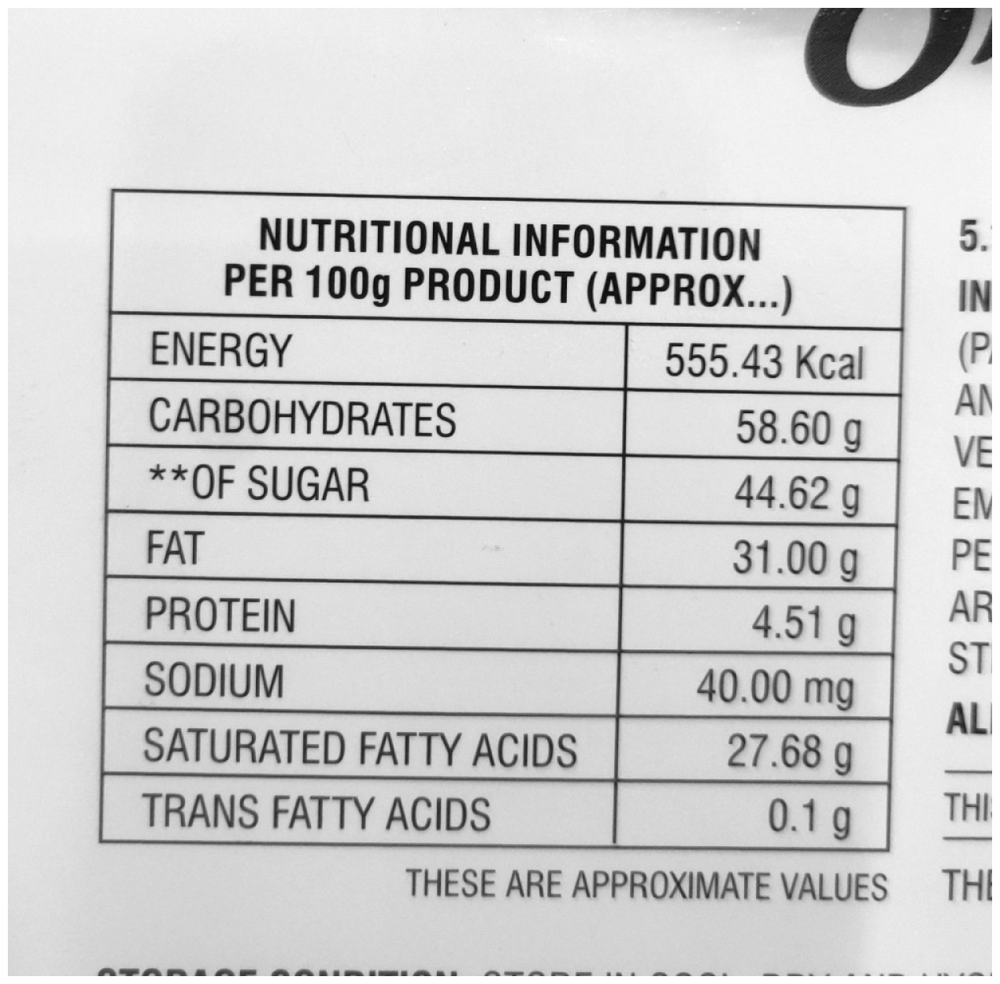

In [143]:
grayscale_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2.imwrite("table/grayscale_image.jpg", grayscale_image)
display("table/grayscale_image.jpg")

Thresholded : We don’t even care about the shades of grey. So, we are reducing the image to just “black” or “white” pixels. Also makes things faster and is needed for further operations.

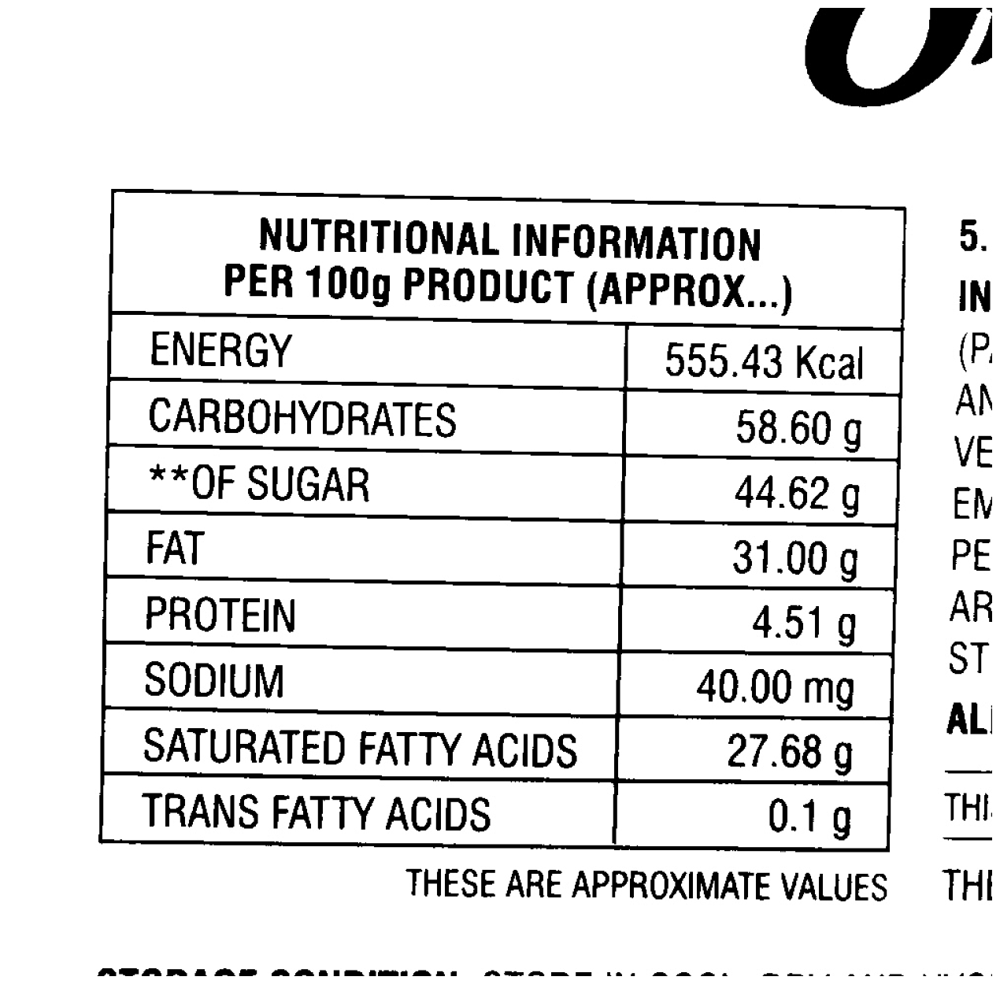

In [144]:
thresholded_image = cv2.threshold(
    grayscale_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
)[1]
cv2.imwrite("table/thresholded_image.jpg", thresholded_image)
display("table/thresholded_image.jpg")

Inverted : 	The image is such that the text is black and the background is white. We need to invert this so that we can apply the next operation.

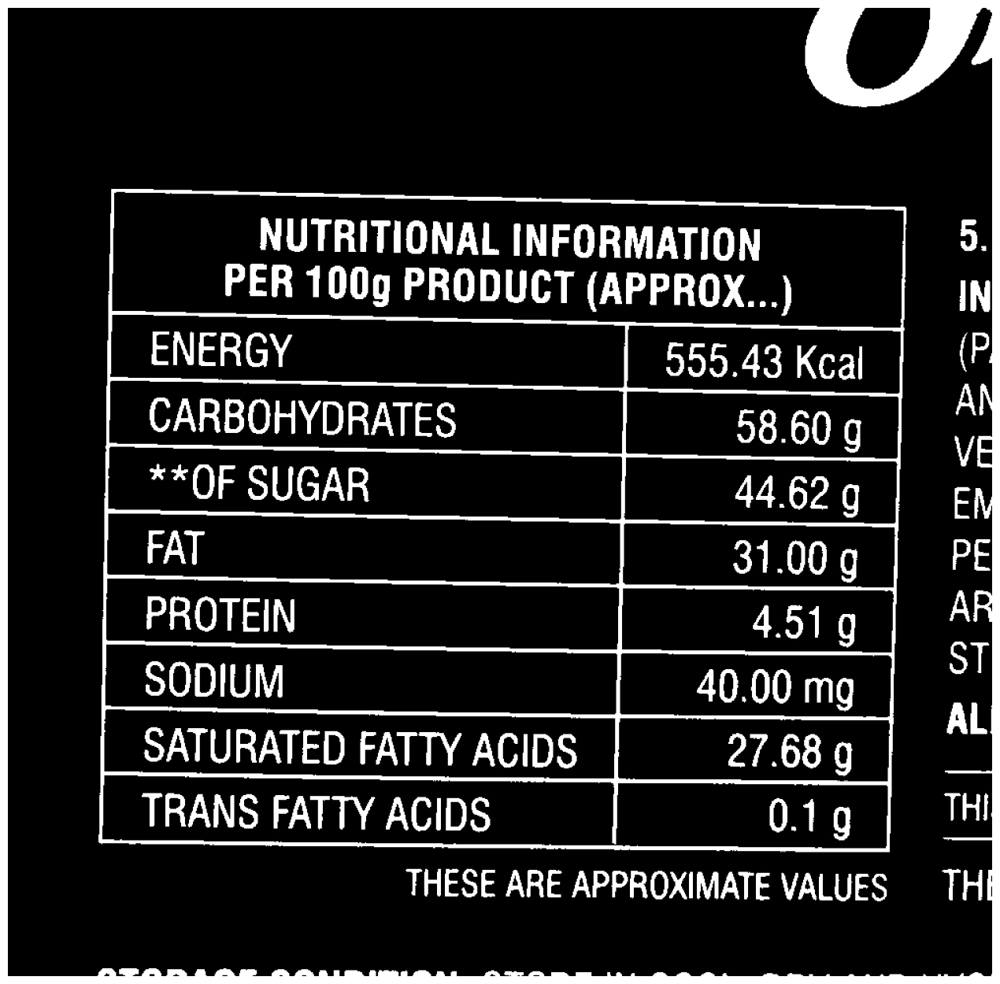

In [145]:
inverted_image = cv2.bitwise_not(thresholded_image)
cv2.imwrite("table/inverted_image.jpg", inverted_image)
display("table/inverted_image.jpg")

Dilated : Here we are going to make all the lines and any shapes in the image thicker. This will help us to correctly identify the “contours” and hopefully the “contour” that makes up the largest box. We are hoping that the largest box is the table.

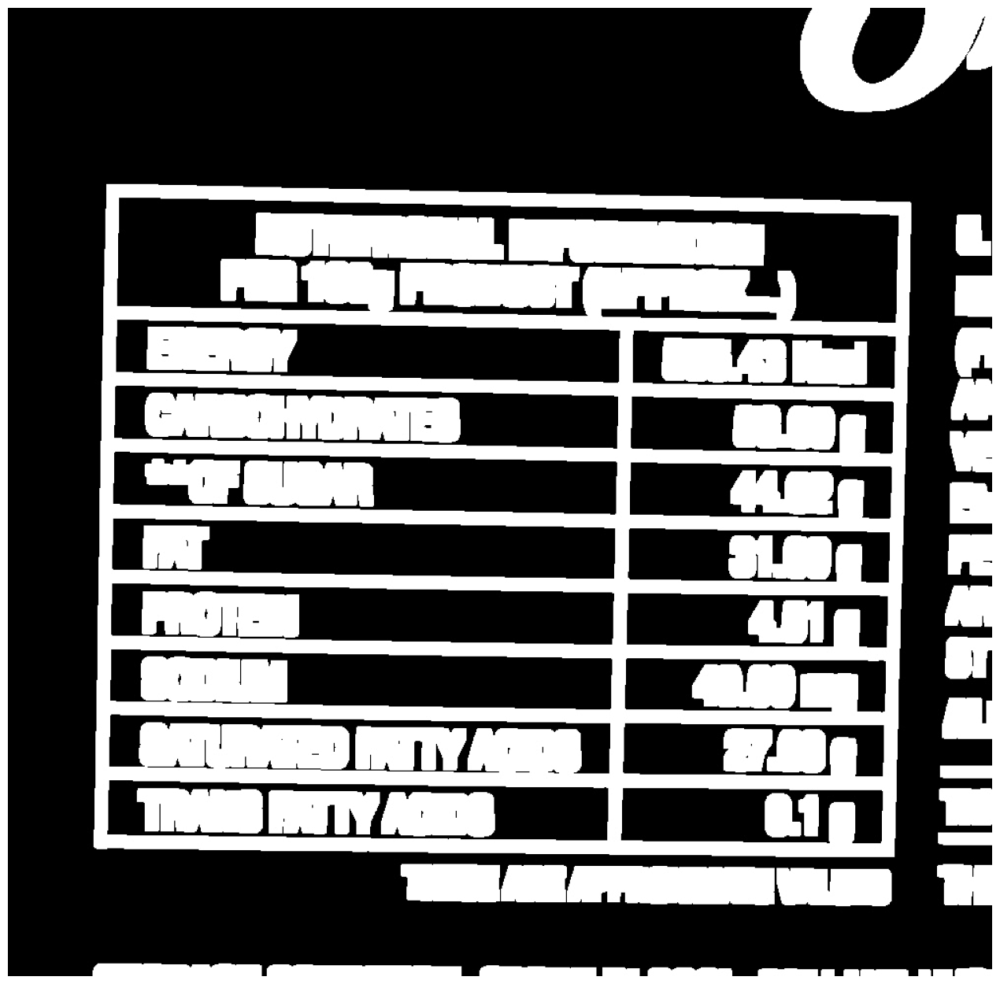

In [146]:
dilated_image = cv2.dilate(inverted_image, None, iterations=5)
cv2.imwrite("table/dilated_image.jpg", dilated_image)
display("table/dilated_image.jpg")

### Step A2: Find & Filter The Contours To Find The Largest Rectangular Contour

 Finding all contours

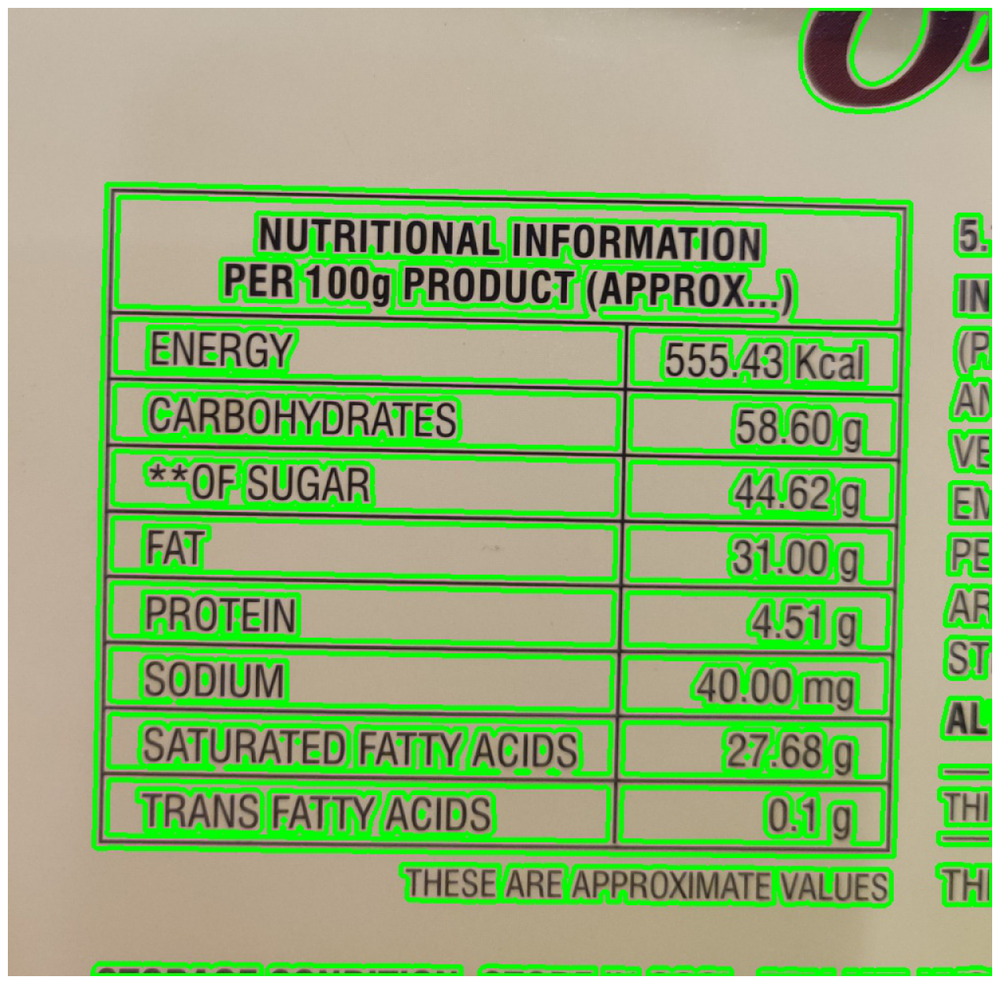

In [147]:
contours, hierarchy = cv2.findContours(dilated_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
image_with_all_contours = img.copy()
cv2.drawContours(image_with_all_contours, contours, -1, (0, 255, 0), 3)
cv2.imwrite("table/image_with_all_contours.jpg", image_with_all_contours)
display("table/image_with_all_contours.jpg")

Filter contours and keep only rectangles

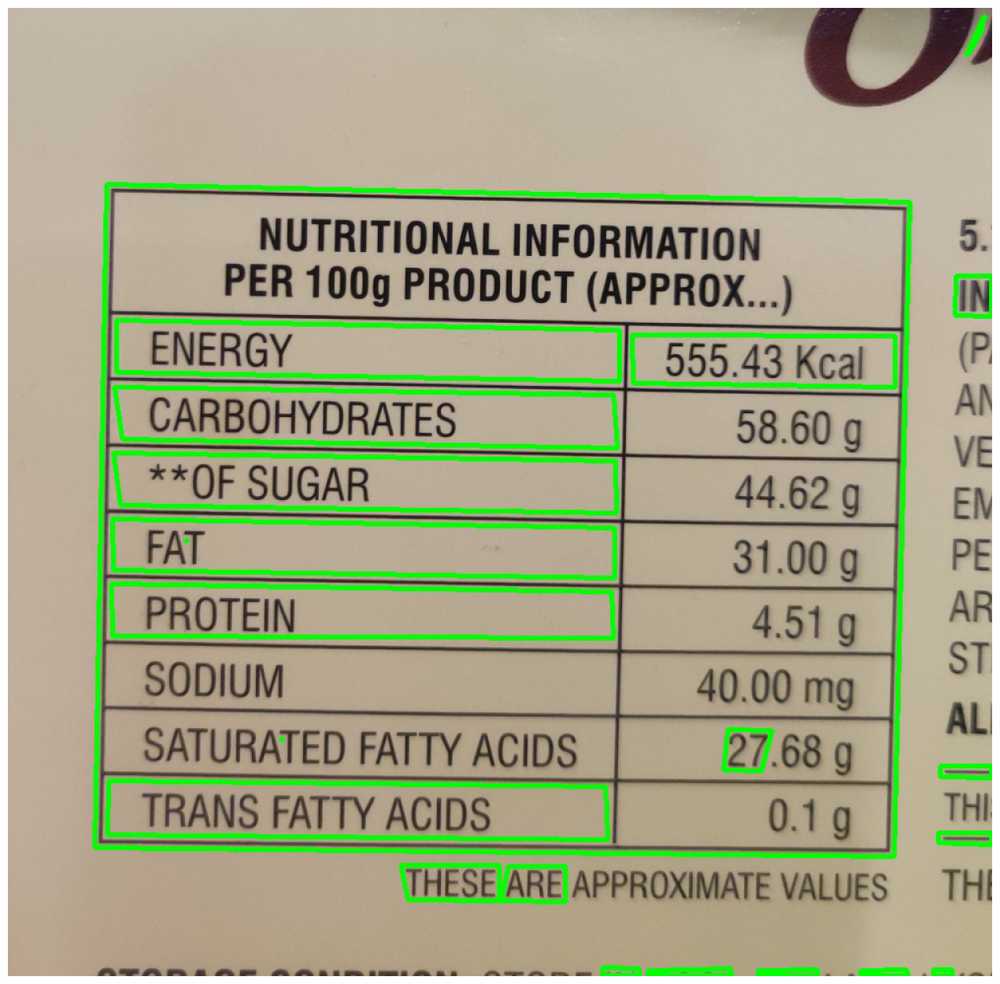

In [148]:
rectangular_contours = []
for contour in contours:
    peri = cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, 0.02 * peri, True)
    if len(approx) == 4:  
        rectangular_contours.append(approx)

image_with_only_rectangular_contours = img.copy()
cv2.drawContours(image_with_only_rectangular_contours, rectangular_contours, -1, (0, 255, 0), 3)
cv2.imwrite("table/image_with_only_rectangular_contours.jpg", image_with_only_rectangular_contours)
display("table/image_with_only_rectangular_contours.jpg")

largest contour by area

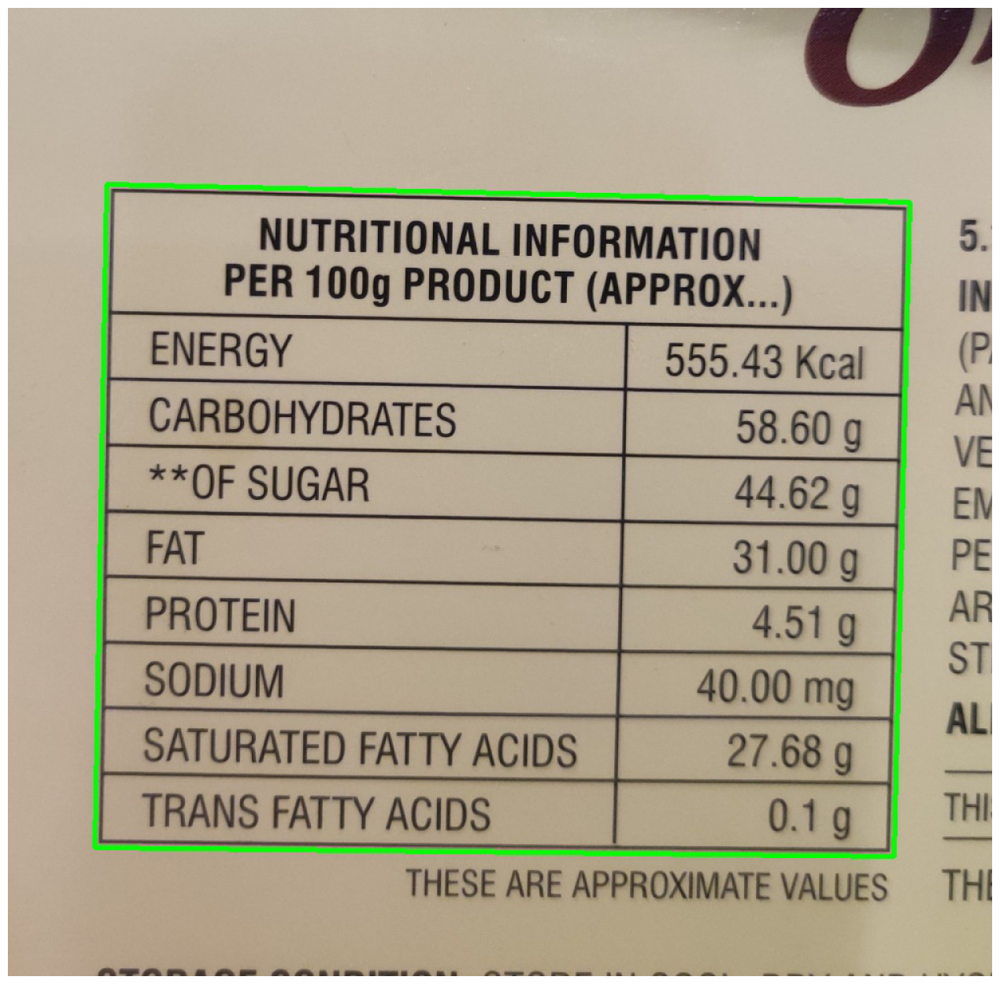

In [149]:
max_area = 0
contour_with_max_area = None
for contour in rectangular_contours:
    area = cv2.contourArea(contour)
    if area > max_area:
        max_area = area
        contour_with_max_area = contour

if contour_with_max_area is not None:
    image_with_contour_with_max_area = img.copy()
    cv2.drawContours(image_with_contour_with_max_area, [contour_with_max_area], -1, (0, 255, 0), 3)
    cv2.imwrite("table/image_with_contour_with_max_area.jpg", image_with_contour_with_max_area)
    display("table/image_with_contour_with_max_area.jpg")
else:
    print("No rectangular contours found.")

## Step A3: Perspective Correction

In [150]:
def order_points(pts):
    # initialize a list of coordinates that will be ordered
    # such that the first entry in the list is the top-left,
    # the second entry is the top-right, the third is the
    # bottom-right, and the fourth is the bottom-left
    pts = pts.reshape(4, 2)
    rect = np.zeros((4, 2), dtype="float32")

    # the top-left point will have the smallest sum, whereas
    # the bottom-right point will have the largest sum
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    # now, compute the difference between the points, the
    # top-right point will have the smallest difference,
    # whereas the bottom-left will have the largest difference
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    # return the ordered coordinates
    return rect

In [151]:
def calculateDistanceBetween2Points(p1, p2):
    dis = ((p2[0] - p1[0]) ** 2 + (p2[1] - p1[1]) ** 2) ** 0.5
    return dis

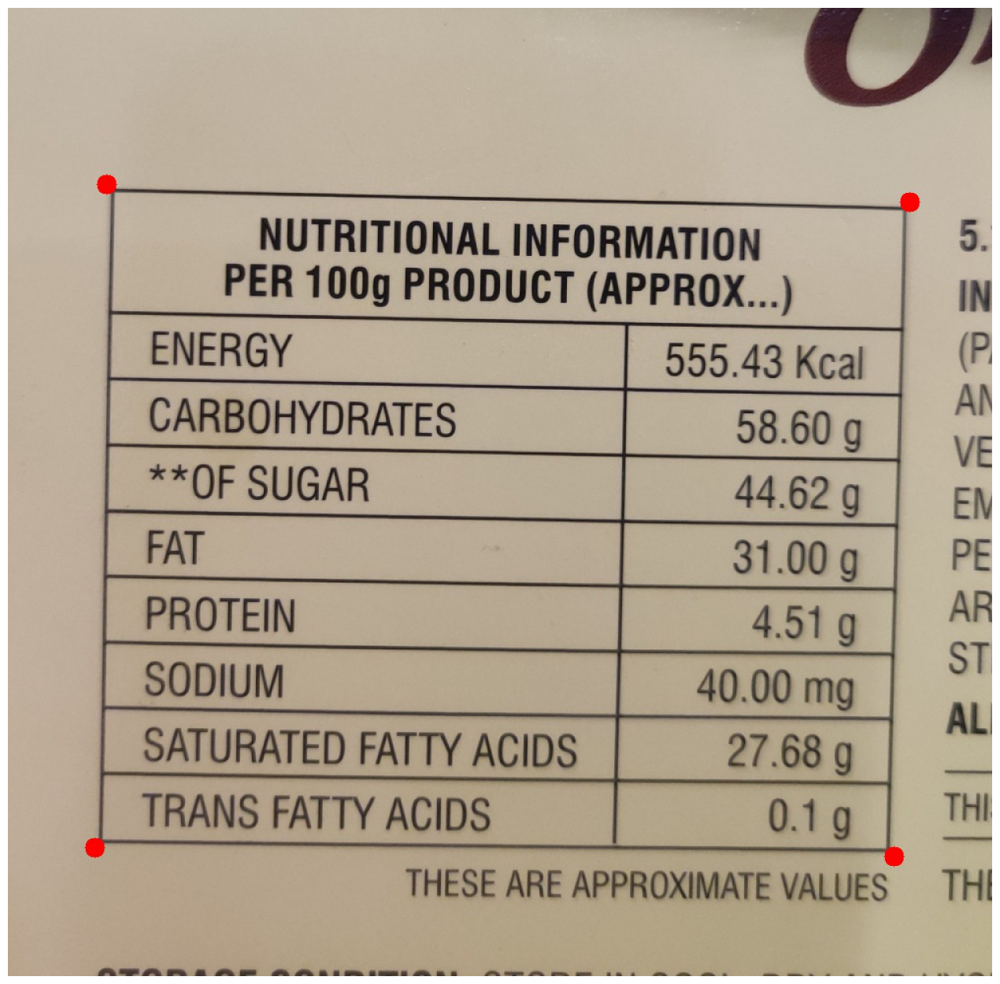

In [152]:
contour_with_max_area_ordered = order_points(contour_with_max_area)
image_with_points_plotted = img.copy()
for point in contour_with_max_area_ordered:
    point_coordinates = (int(point[0]), int(point[1]))
    image_with_points_plotted = cv2.circle(image_with_points_plotted, point_coordinates, 10, (0, 0, 255), -1)
cv2.imwrite("table/image_with_points_plotted.jpg", image_with_points_plotted)
display("table/image_with_points_plotted.jpg")

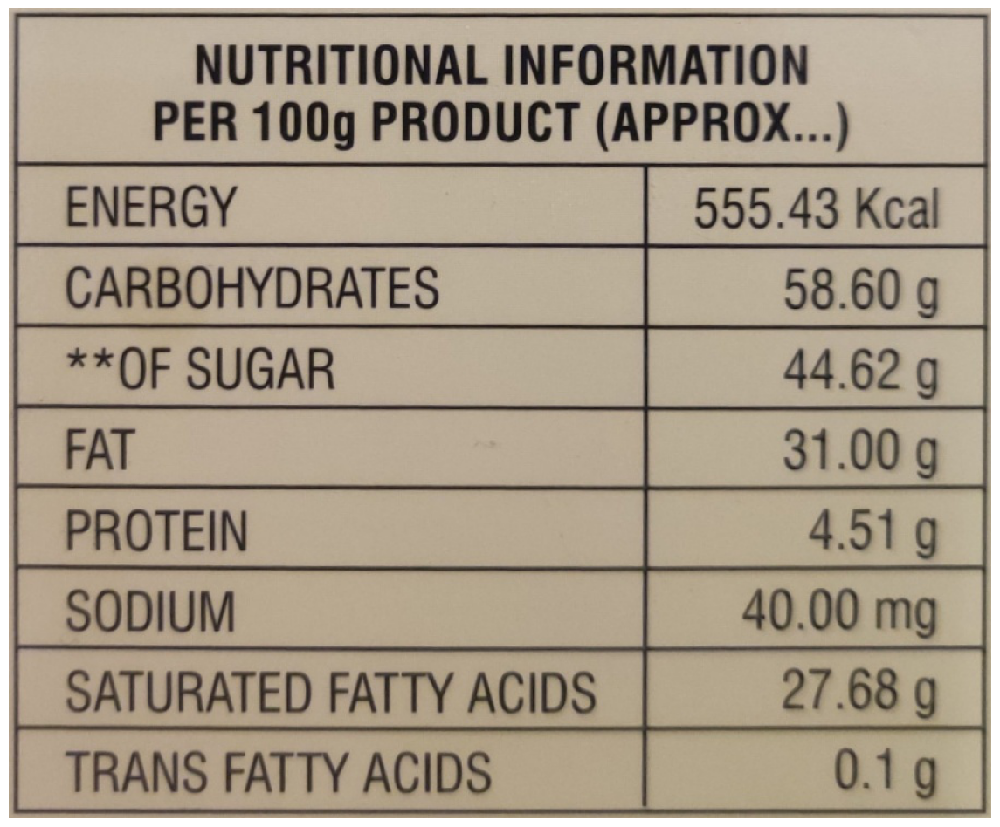

In [153]:
existing_image_width = img.shape[1]
existing_image_width_reduced_by_10_percent = int(existing_image_width * 0.9)

distance_between_top_left_and_top_right = calculateDistanceBetween2Points(contour_with_max_area_ordered[0], contour_with_max_area_ordered[1])
distance_between_top_left_and_bottom_left = calculateDistanceBetween2Points(contour_with_max_area_ordered[0], contour_with_max_area_ordered[3])
aspect_ratio = distance_between_top_left_and_bottom_left / distance_between_top_left_and_top_right
new_image_width = existing_image_width_reduced_by_10_percent
new_image_height = int(new_image_width * aspect_ratio)


pts1 = np.float32(contour_with_max_area_ordered)
pts2 = np.float32([[0, 0], [new_image_width, 0], [new_image_width, new_image_height], [0, new_image_height]])
matrix = cv2.getPerspectiveTransform(pts1, pts2)
perspective_corrected_image = cv2.warpPerspective(img, matrix, (new_image_width, new_image_height))
cv2.imwrite("table/perspective_corrected_image.jpg", perspective_corrected_image)
display("table/perspective_corrected_image.jpg")

Add the padding

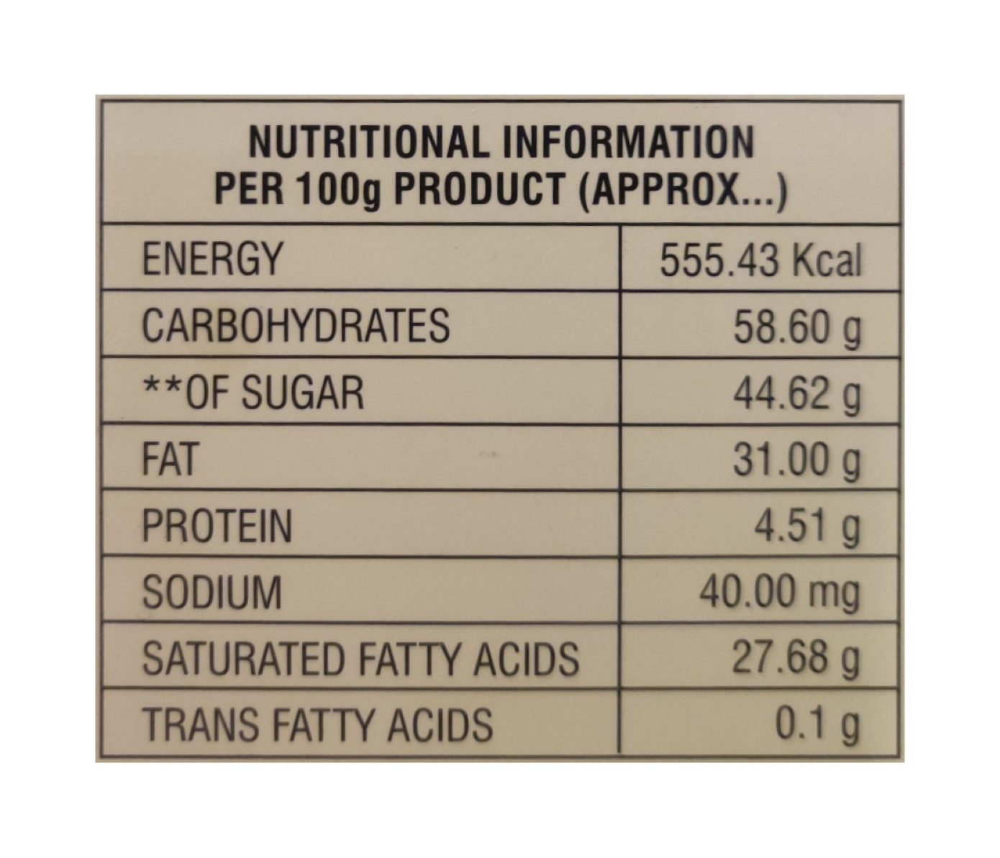

In [154]:
image_height = img.shape[0]
padding = int(image_height * 0.1)
perspective_corrected_image_with_padding = cv2.copyMakeBorder(
    perspective_corrected_image,
    padding,
    padding,
    padding,
    padding,
    cv2.BORDER_CONSTANT,
    value=[255, 255, 255],
)

cv2.imwrite("table/perspective_corrected_image_with_padding.jpg", perspective_corrected_image_with_padding)
display("table/perspective_corrected_image_with_padding.jpg")

## Stage B: Removing The Lines

### Step B1: Preprocessing

In [188]:
image_file = "table/perspective_corrected_image_with_padding.jpg"
img1 = cv2.imread(image_file)

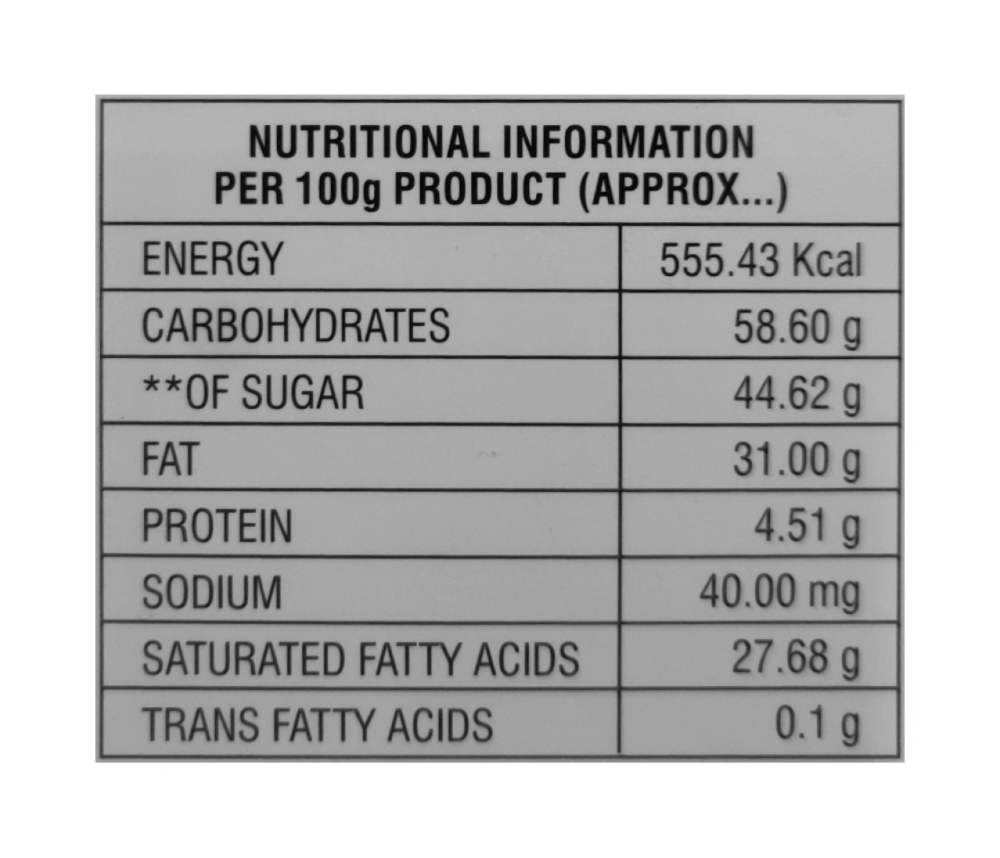

In [189]:
grayscale_image = cv2.cvtColor(img1, cv2.COLOR_BGRA2GRAY)
cv2.imwrite("table/grayscale_image.jpg", grayscale_image)
display("table/grayscale_image.jpg")

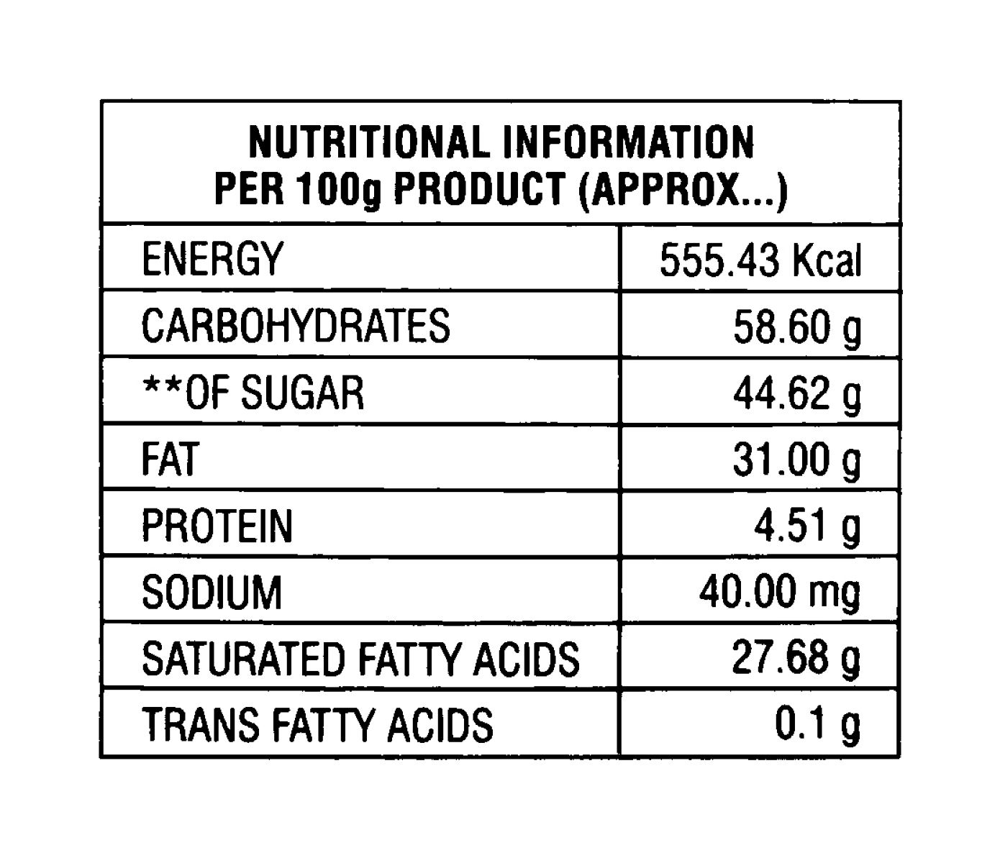

In [190]:
thresholded_image = cv2.threshold(grayscale_image, 127, 255, cv2.THRESH_BINARY)[1]
cv2.imwrite("table/thresholded_image.jpg", thresholded_image)
display("table/thresholded_image.jpg")

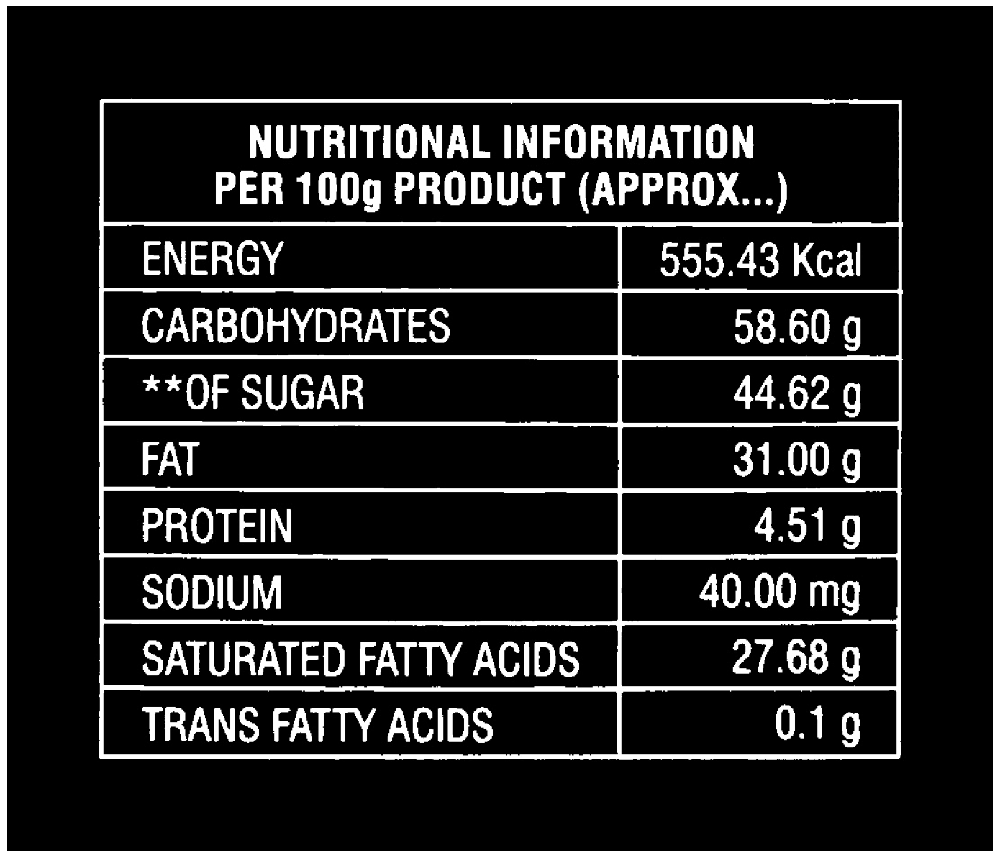

In [191]:
inverted_image = cv2.bitwise_not(thresholded_image)
cv2.imwrite("table/inverted_image.jpg", inverted_image)
display("table/inverted_image.jpg")


erode_vertical_lines

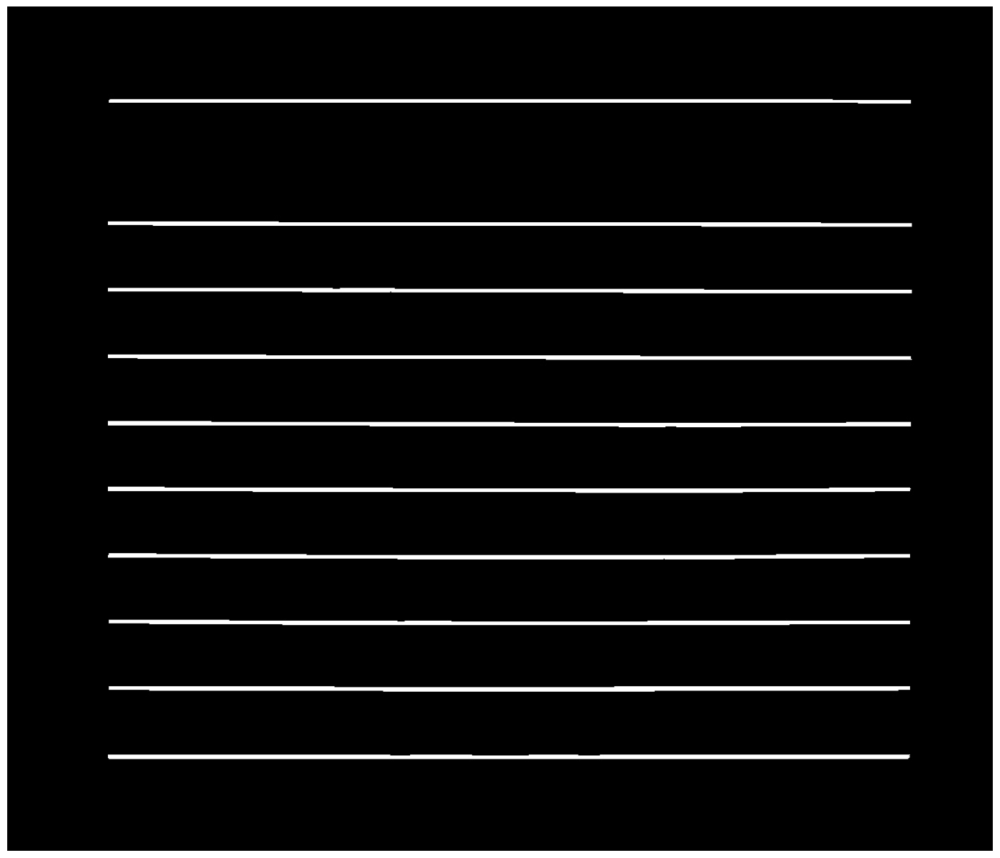

In [192]:
hor = np.array([[1,1,1,1,1,1]])
vertical_lines_eroded_image = cv2.erode(inverted_image, hor, iterations=10)
vertical_lines_eroded_image = cv2.dilate(vertical_lines_eroded_image, hor, iterations=10)
cv2.imwrite("table/vertical_lines_eroded_image.jpg", vertical_lines_eroded_image)
display("table/vertical_lines_eroded_image.jpg")

### Step B3: Eroding Horizontal Lines

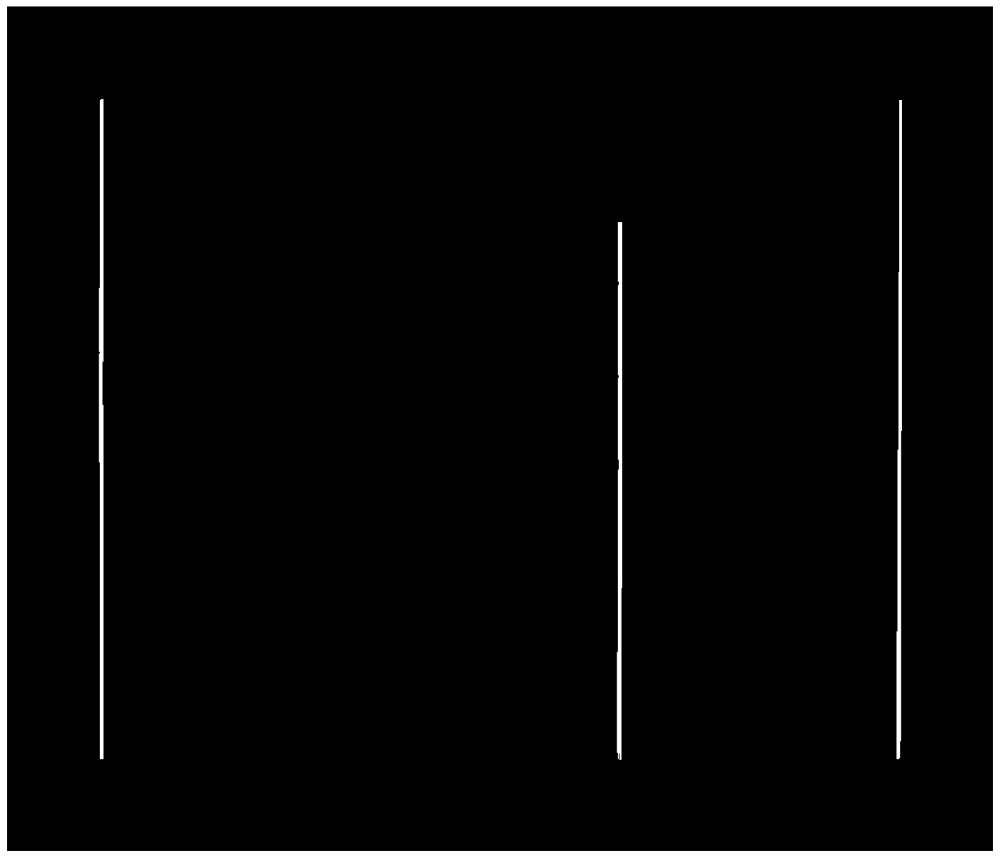

In [193]:
ver = np.array([[1], [1], [1], [1], [1], [1], [1]])
horizontal_lines_eroded_image = cv2.erode(inverted_image, ver, iterations=10)
horizontal_lines_eroded_image = cv2.dilate(
    horizontal_lines_eroded_image, ver, iterations=10
)
cv2.imwrite("table/horizontal_lines_eroded_image.jpg", horizontal_lines_eroded_image)
display("table/horizontal_lines_eroded_image.jpg")

### Step B4: Combining Vertical And Horizontal Lines

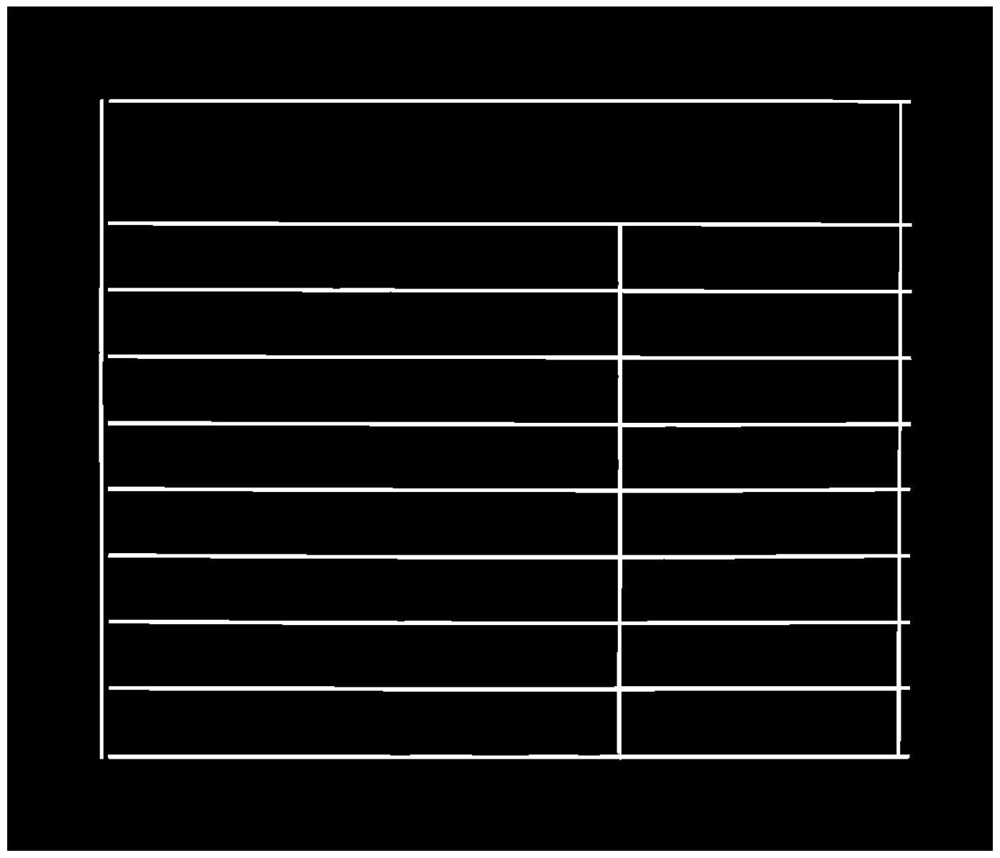

In [194]:
combined_image = cv2.add(vertical_lines_eroded_image, horizontal_lines_eroded_image)
cv2.imwrite("table/combined_image.jpg", combined_image)
display("table/combined_image.jpg")

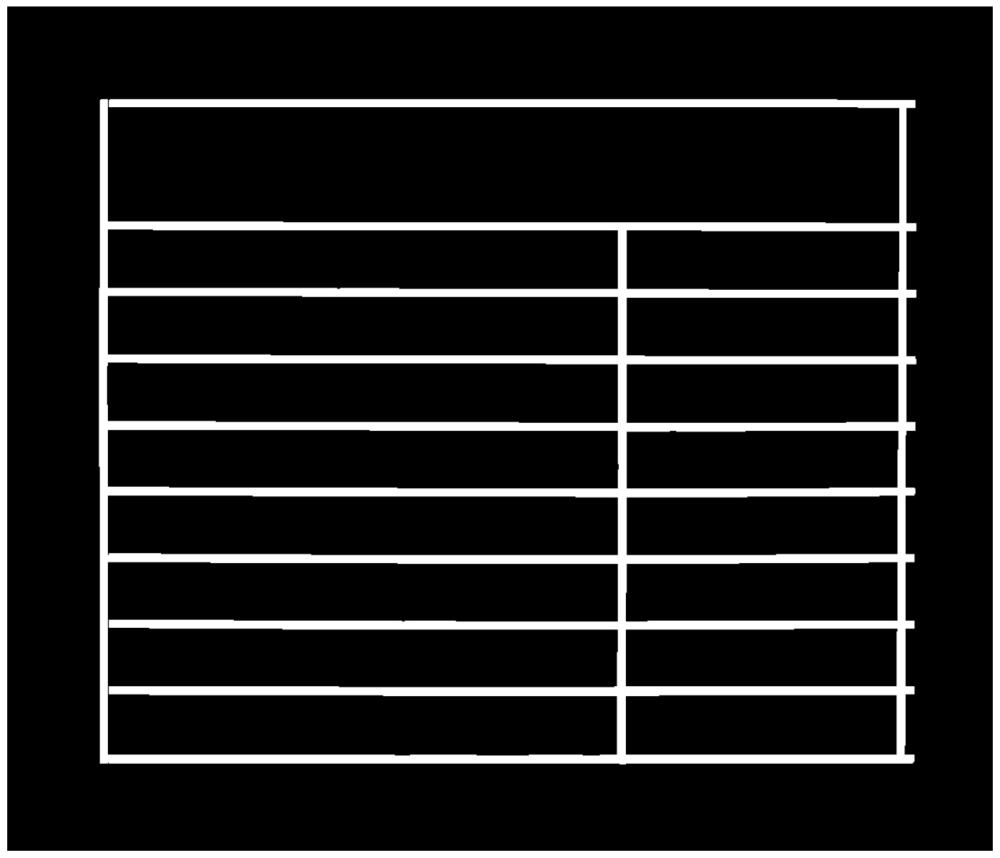

In [195]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
combined_image_dilated = cv2.dilate(combined_image, kernel, iterations=5)

cv2.imwrite("table/combined_image_dilated.jpg", combined_image_dilated)
display("table/combined_image_dilated.jpg")

### Step B5: Removing The Lines

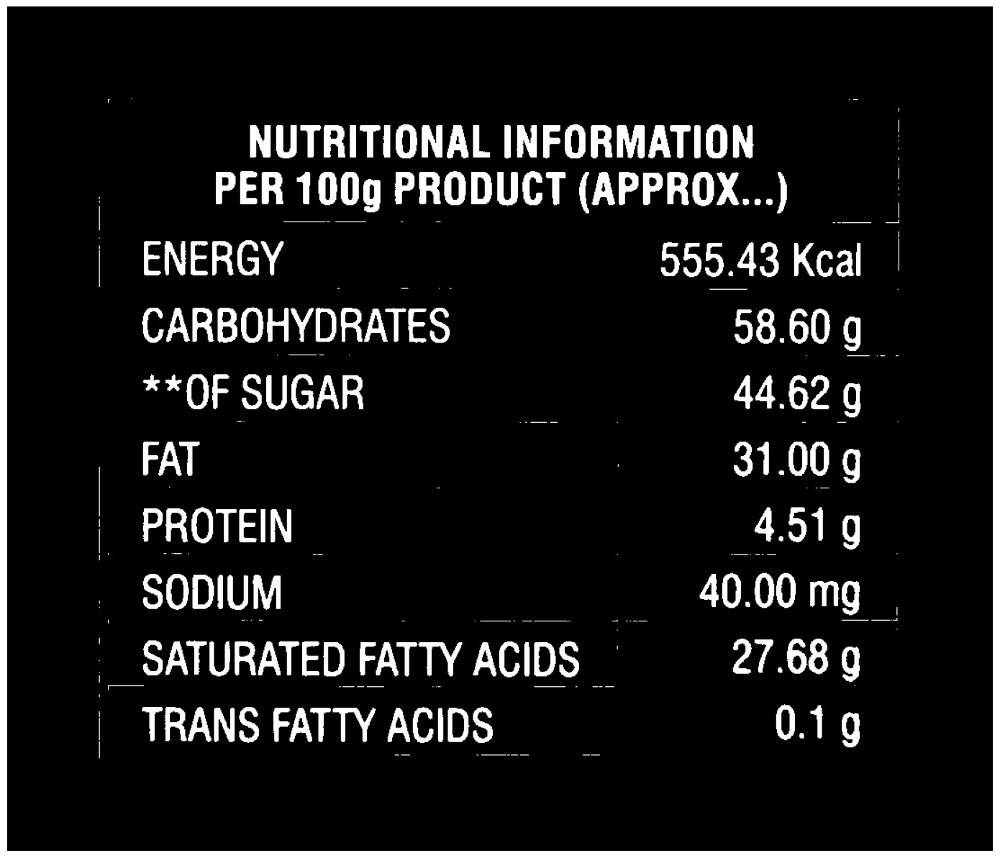

In [196]:
image_without_lines = cv2.subtract(inverted_image, combined_image_dilated)
cv2.imwrite("table/image_without_lines.jpg", image_without_lines)
display("table/image_without_lines.jpg")



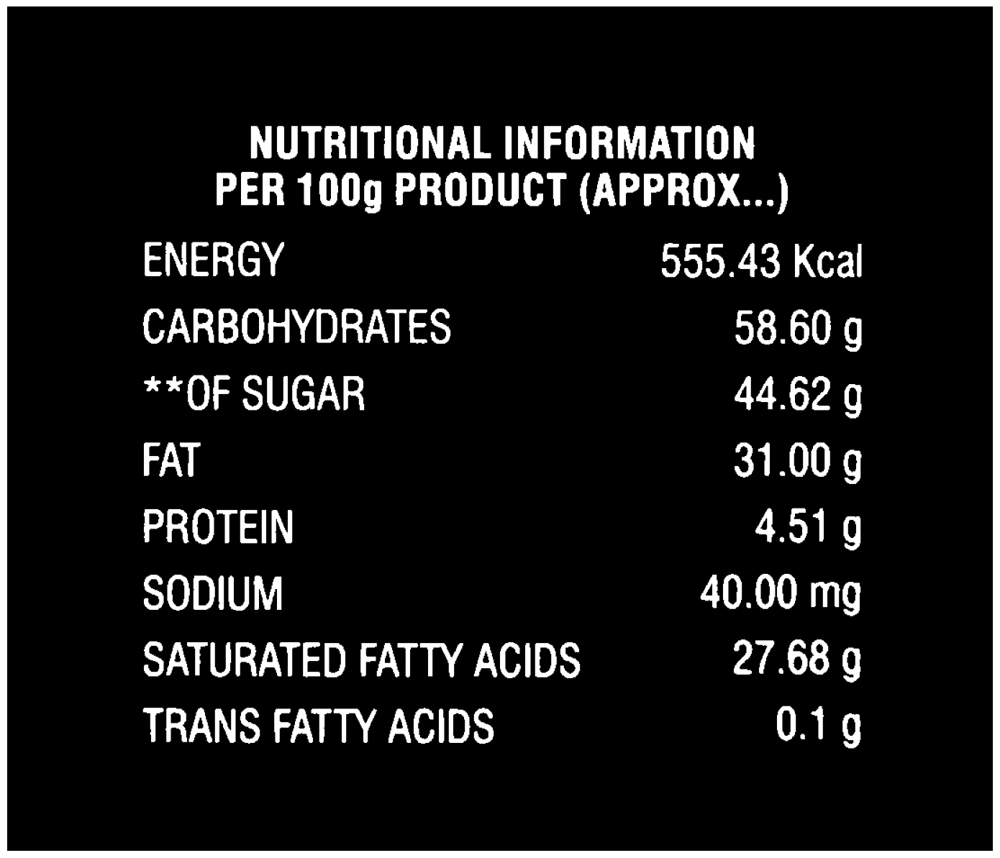

In [197]:
image_without_lines_noise_removed = cv2.erode(image_without_lines, kernel, iterations=1)
image_without_lines_noise_removed = cv2.dilate(image_without_lines_noise_removed, kernel, iterations=1)
cv2.imwrite("table/image_without_lines_noise_removed.jpg", image_without_lines_noise_removed)
display("table/image_without_lines_noise_removed.jpg")

## Stage C: Finding the cells & extracting the text using OCR

### Stage C: High-Level Plan


Step C1: Use Dilation To Convert The Words Into Blobs

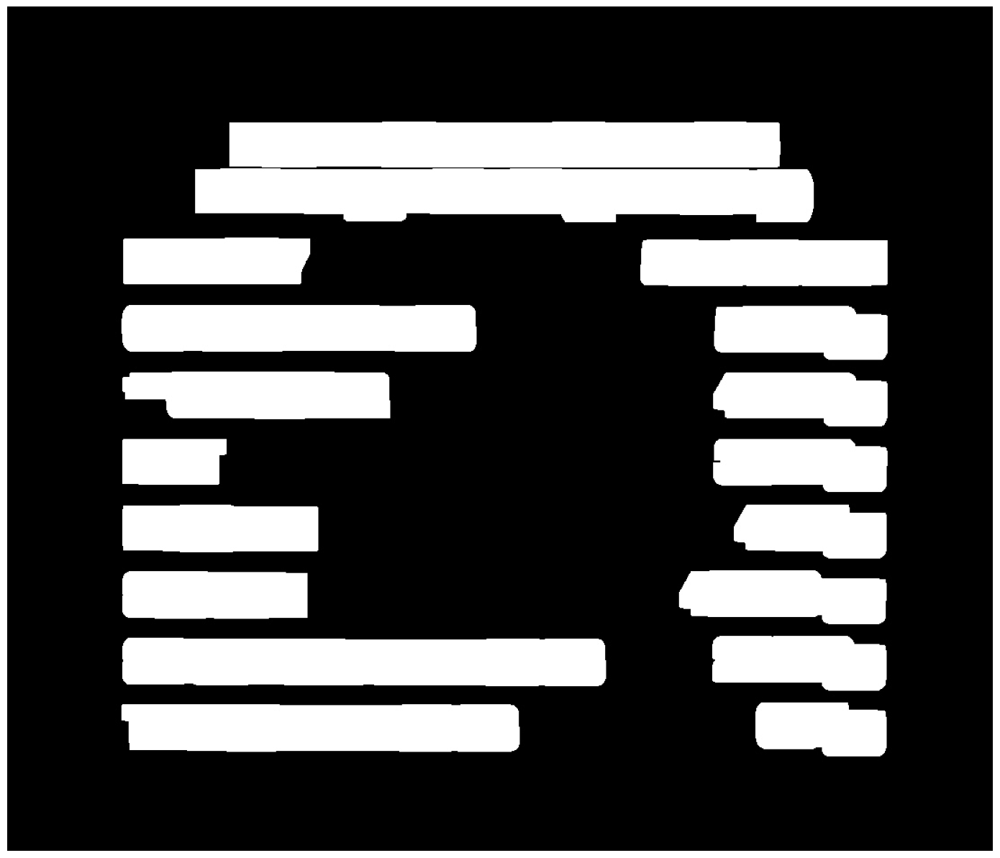

In [198]:
kernel_to_remove_gaps_between_words = np.array([
            [1,1,1,1,1,1,1,1,1,1],
            [1,1,1,1,1,1,1,1,1,1]
    ])
dilated_image = cv2.dilate(image_without_lines_noise_removed, kernel_to_remove_gaps_between_words, iterations=5)
simple_kernel = np.ones((5,5), np.uint8)
dilated_image = cv2.dilate(dilated_image, simple_kernel, iterations=2)
cv2.imwrite("table/dilated_image.jpg", dilated_image)
display("table/dilated_image.jpg")


### Step C2: Find The Contours Of The Blobs

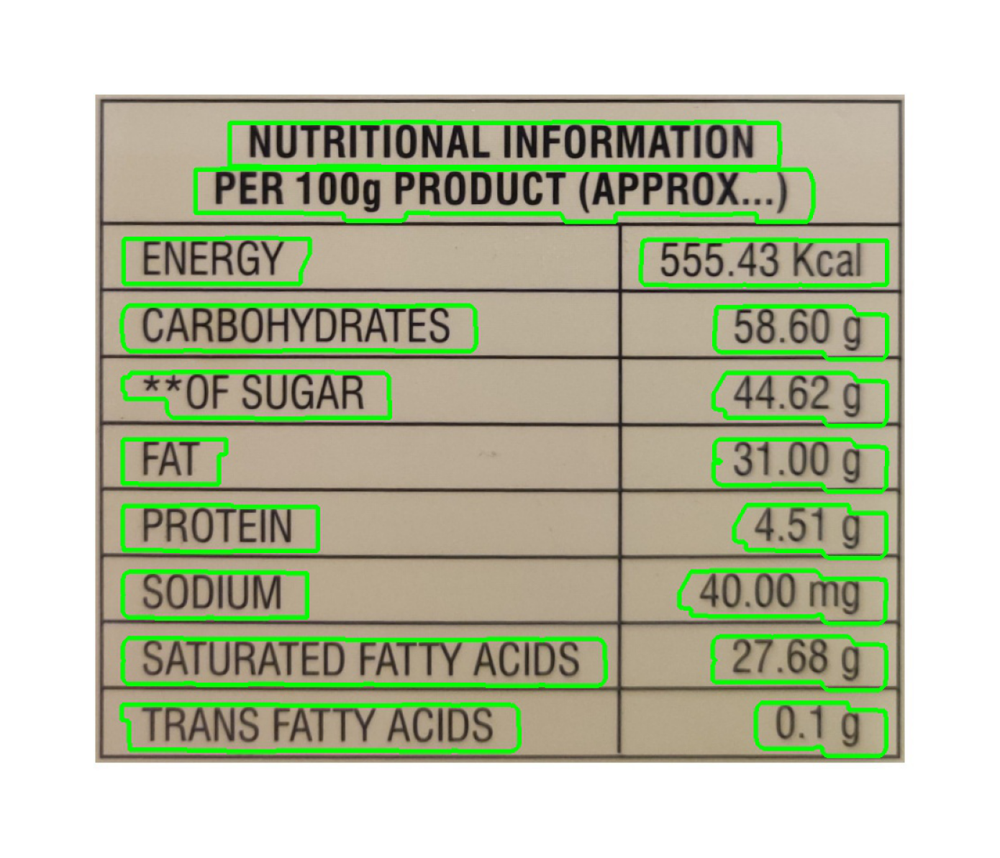

In [200]:
result = cv2.findContours(dilated_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = result[0]
# The code below is for visualization purposes only.
# It is not necessary for the OCR to work.
image_with_contours_drawn = img.copy()
cv2.drawContours(image_with_contours_drawn, contours, -1, (0, 255, 0), 3)
cv2.imwrite("table/image_with_contours_drawn.jpg", image_with_contours_drawn)
display("table/image_with_contours_drawn.jpg")


### Step C3: Convert The Blobs Into Bounding Boxes

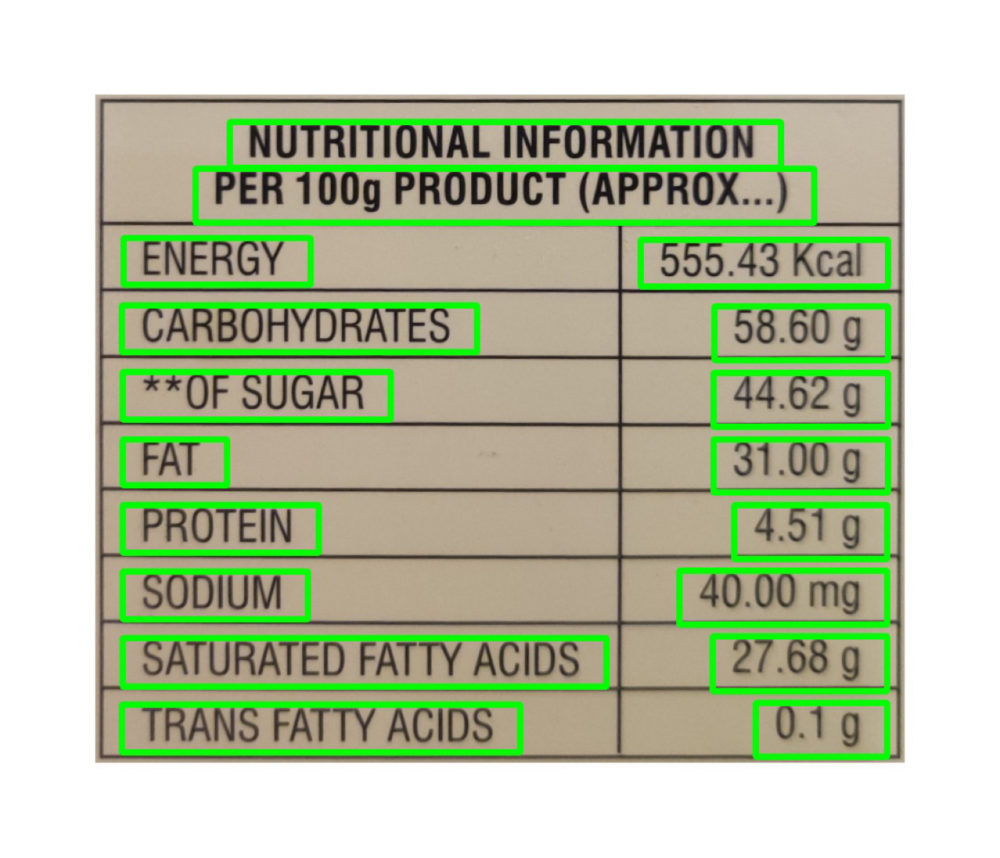

In [203]:
bounding_boxes = []
image_with_all_bounding_boxes = img.copy()
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    bounding_boxes.append((x, y, w, h))
    # This line below is about
    # drawing a rectangle on the image with the shape of
    # the bounding box. Its not needed for the OCR.
    # Its just added for debugging purposes.
    image_with_all_bounding_boxes = cv2.rectangle(image_with_all_bounding_boxes, (x, y), (x + w, y + h), (0, 255, 0), 5)
cv2.imwrite("table/image_with_all_bounding_boxes.jpg", image_with_all_bounding_boxes)
display("table/image_with_all_bounding_boxes.jpg")

### Step C4: Sorting The Bounding Boxes By X And Y Coordinates To Make Rows And Columns

In [204]:
def sort_bounding_boxes_by_y_coordinate(self):
    self.bounding_boxes = sorted(self.bounding_boxes, key=lambda x: x[1])

In [206]:
heights = []
for bounding_box in bounding_boxes:
    x, y, w, h = bounding_box
    heights.append(h)
mean_height =np.mean(heights)

bounding_boxes = sorted(bounding_boxes, key=lambda x: x[1])
rows = []
half_of_mean_height = mean_height / 2
current_row = [ bounding_boxes[0] ]
for bounding_box in bounding_boxes[1:]:
    current_bounding_box_y = bounding_box[1]
    previous_bounding_box_y = current_row[-1][1]
    distance_between_bounding_boxes = abs(current_bounding_box_y - previous_bounding_box_y)
    if distance_between_bounding_boxes <= half_of_mean_height:
        current_row.append(bounding_box)
    else:
        rows.append(current_row)
        current_row = [ bounding_box ]
rows.append(current_row)
for row in rows:
    row.sort(key=lambda x: x[0])
    


### Step C5: Extracting The Text From The Bounding Boxes Using OCR

In [215]:
import subprocess

In [216]:
def get_result_from_tersseract(image_path):
    output = subprocess.getoutput(
        "tesseract "
        + image_path
        + ' - -l eng --oem 3 --psm 7 --dpi 72 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789().calmg* "'
    )
    output = output.strip()
    return output

In [217]:
table = []
current_row = []
image_number = 0
for row in rows:
    for bounding_box in row:
        x, y, w, h = bounding_box
        y = y - 5
        cropped_image = img1[y : y + h, x : x + w]
        image_slice_path =  "output/" + str(image_number) + ".jpg"
        cv2.imwrite(image_slice_path, cropped_image)
        results_from_ocr = get_result_from_tersseract(image_slice_path)
        current_row.append(results_from_ocr)
        image_number += 1
    table.append(current_row)
    current_row = []

In [218]:
def generate_csv_file(table):
    with open("output.csv", "w") as f:
        for row in table:
            f.write(",".join(row) + "\n")

In [219]:
generate_csv_file(table)